# Analyse exploratoire

# Segmentation des clients d’olist

Olist est une plateforme brésilienne qui opère dans le segment du commerce électronique. Son service consiste en la gestion du processus de vente entre les commerçants et les clients et comprend également un rapport sur la satisfaction des clients.

Olist souhaite fournir à ses équipes d’e-commerce une segmentation des clients qu’elles pourront utiliser au quotidien pour leurs campagnes de communication.

L’objectif est de comprendre les différents types d’utilisateurs grâce à leur comportement et à leurs données personnelles.

Nous devons fournir à l’équipe marketing une description actionnable de notre segmentation et de sa logique sous-jacente pour une utilisation optimale, ainsi qu’une proposition de contrat de maintenance basée sur une analyse de la stabilité des segments au cours du temps.

**Énoncé du problème**

Cette analyse de segmentation de la clientèle passe en revue le comportement d’achat. 

**Approche**

1. Aperçu rapide (profiling)
2. Analyse exploratoire des données et feature engineering
3. Statistique (fréquence)
4. Analyse RFM et Valeurs atypiques
5. Conclusion

## Aperçu rapide profiling

In [78]:
import numpy as np
import pandas as pd
from pandas_profiling import ProfileReport
import matplotlib.pyplot as plt
import seaborn as sns
import squarify
%matplotlib inline

from glob import glob
from datetime import datetime

# import warnings
# warnings.filterwarnings('ignore')

In [2]:
# Chargeons tous les ensembles de données :

customers_df = pd.read_csv("data/olist_customers_dataset.csv")
geolocation_df = pd.read_csv('data/olist_geolocation_dataset.csv')
orders_df = pd.read_csv('data/olist_orders_dataset.csv')
order_items_df = pd.read_csv('data/olist_order_items_dataset.csv')
order_payments_df = pd.read_csv('data/olist_order_payments_dataset.csv')
order_reviews_df = pd.read_csv('data/olist_order_reviews_dataset.csviews_dataset.csv')
products_df = pd.read_csv('data/olist_products_dataset.csv')
sellers_df = pd.read_csv('data/olist_sellers_dataset.csv')
category_transalations_df = pd.read_csv(
    'data/product_category_name_translation.csv')

Avec la librairie **pandas_profiling** nous pouvons avoir un rapide aperçu des différentes sources de données que l'on nous a fournies.

### olist_customers_dataset

In [3]:
profile = ProfileReport(customers_df,
                        title="Pandas Profiling Report",
                        explorative=True)

In [4]:
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### olist_geolocation_dataset

In [5]:
profile = ProfileReport(geolocation_df,
                        title="Pandas Profiling Report",
                        explorative=True)

In [6]:
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### olist_orders_dataset

In [7]:
profile = ProfileReport(orders_df,
                        title="Pandas Profiling Report",
                        explorative=True)

In [8]:
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### olist_order_items_dataset

In [9]:
profile = ProfileReport(order_items_df,
                        title="Pandas Profiling Report",
                        explorative=True)

In [10]:
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### olist_order_payments_dataset

In [11]:
profile = ProfileReport(order_payments_df,
                        title="Pandas Profiling Report",
                        explorative=True)

In [12]:
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### olist_order_reviews_dataset

In [13]:
profile = ProfileReport(order_reviews_df,
                        title="Pandas Profiling Report",
                        explorative=True)

In [14]:
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### olist_products_dataset

In [15]:
profile = ProfileReport(products_df,
                        title="Pandas Profiling Report",
                        explorative=True)

In [16]:
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### olist_sellers_dataset

In [17]:
profile = ProfileReport(sellers_df,
                        title="Pandas Profiling Report",
                        explorative=True)

In [18]:
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### category_transalations_df

In [19]:
profile = ProfileReport(category_transalations_df,
                        title="Pandas Profiling Report",
                        explorative=True)

In [20]:
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## EDA

In [21]:
# Vérifions la taille de chaque dataframe

df_names = [
    'customers_df', 'geolocation_df', 'orders_df', 'order_items_df',
    'order_payments_df', 'order_reviews_df', 'products_df', 'sellers_df',
    'category_transalations_df'
]
for df in df_names:
    print("Dataset {} has shape {}".format(df, eval(df).shape))

Dataset customers_df has shape (99441, 5)
Dataset geolocation_df has shape (1000163, 5)
Dataset orders_df has shape (99441, 8)
Dataset order_items_df has shape (112650, 7)
Dataset order_payments_df has shape (103886, 5)
Dataset order_reviews_df has shape (99224, 7)
Dataset products_df has shape (32951, 9)
Dataset sellers_df has shape (3095, 4)
Dataset category_transalations_df has shape (71, 2)


Grâce au profiling, nous savons qu'il n'y a pas de valeurs manquantes exceptées dans les df **orders_df**, **products_df** et **order_reviews_df**.

In [22]:
orders_df.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15 00:00:00
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26 00:00:00


In [23]:
orders_df.isnull().sum()

order_id                            0
customer_id                         0
order_status                        0
order_purchase_timestamp            0
order_approved_at                 160
order_delivered_carrier_date     1783
order_delivered_customer_date    2965
order_estimated_delivery_date       0
dtype: int64

Toutes les valeurs manquantes sont des valeurs d'horodatage (date + heure), ces valeurs sont les suivantes :

- **l'horodatage d'approbation**
- **horodatage de la livraison du transporteur**
- **le timbre de livraison du client.**

L'approbation de la commande suit l'achat de la commande et se produit généralement peu de temps après, donc nous pouvons remplacer les valeurs manquantes de la variable **order_approved_at** par les valeurs de la variable **order_purchase_timestamp**.

D'après nos observations, l'horodatage de la livraison du transporteur est souvent le même que la date d'approbation de la commande, nous pouvons donc remplacer les valeurs manquantes de la variable **order_delivered_carrier_date** par les valeurs de la variable **order_approved_at**.

On constate également que la date de livraison estimée est souvent postérieure à la date de livraison réelle du client. On peut donc facilement remplacer les valeurs manquantes de la variable **order_delivered_customer_date** par les valeurs de la variable **order_estimated_delivery_date**.

In [24]:
# Remplace les valeurs manquantes par les variables citées plus haut

orders_df["order_approved_at"] = orders_df["order_approved_at"].fillna(
    orders_df["order_purchase_timestamp"])
orders_df["order_delivered_carrier_date"] = orders_df[
    "order_delivered_carrier_date"].fillna(orders_df["order_approved_at"])
orders_df["order_delivered_customer_date"] = orders_df[
    "order_delivered_customer_date"].fillna(
        orders_df["order_estimated_delivery_date"])

In [25]:
orders_df.isnull().sum()

order_id                         0
customer_id                      0
order_status                     0
order_purchase_timestamp         0
order_approved_at                0
order_delivered_carrier_date     0
order_delivered_customer_date    0
order_estimated_delivery_date    0
dtype: int64

Aucune valeur manquante dans l'ensemble de données des commandes. Maintenant, vérifions les données **produits**.

In [26]:
products_df.isnull().sum()

product_id                      0
product_category_name         610
product_name_lenght           610
product_description_lenght    610
product_photos_qty            610
product_weight_g                2
product_length_cm               2
product_height_cm               2
product_width_cm                2
dtype: int64

In [27]:
products_df = products_df.rename(
    columns={
        'product_name_lenght': 'product_name_len',
        'product_description_lenght': 'product_description_len'
    })

In [28]:
products_df.isnull().sum()

product_id                   0
product_category_name      610
product_name_len           610
product_description_len    610
product_photos_qty         610
product_weight_g             2
product_length_cm            2
product_height_cm            2
product_width_cm             2
dtype: int64

**Le nom, la description et la catégorie du produit sont manquants** pour plus de **600 produits**, ainsi que **les détails des tailles de 2 produits** sont manquants. 

Nous allons supprimer toutes ces valeurs manquantes.

In [29]:
products_df = products_df[~(products_df['product_weight_g'].isnull())]

In [30]:
products_df = products_df[~(products_df['product_name_len'].isnull())]

In [31]:
products_df.isnull().sum()

product_id                 0
product_category_name      0
product_name_len           0
product_description_len    0
product_photos_qty         0
product_weight_g           0
product_length_cm          0
product_height_cm          0
product_width_cm           0
dtype: int64

Nous n'avons pas besoin des données de review, nous passerons donc le traitement de ces données.

In [32]:
# Fusionnons tous les ensembles de données, puis analysons les valeurs nulles.

df = pd.merge(orders_df, order_payments_df, on="order_id")
df = pd.merge(df, customers_df, on="customer_id")
df = pd.merge(df, order_items_df, on="order_id")
df = pd.merge(df, sellers_df, on="seller_id")
df = pd.merge(df, order_reviews_df, on="order_id")
df = pd.merge(df, products_df, on="product_id")
df = pd.merge(df, category_transalations_df, on="product_category_name")

df.shape

(115608, 40)

In [33]:
df.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,payment_sequential,payment_type,...,review_answer_timestamp,product_category_name,product_name_len,product_description_len,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,1,credit_card,...,2017-10-12 03:43:48,utilidades_domesticas,40.0,268.0,4.0,500.0,19.0,8.0,13.0,housewares
1,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,3,voucher,...,2017-10-12 03:43:48,utilidades_domesticas,40.0,268.0,4.0,500.0,19.0,8.0,13.0,housewares
2,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,2,voucher,...,2017-10-12 03:43:48,utilidades_domesticas,40.0,268.0,4.0,500.0,19.0,8.0,13.0,housewares
3,128e10d95713541c87cd1a2e48201934,a20e8105f23924cd00833fd87daa0831,delivered,2017-08-15 18:29:31,2017-08-15 20:05:16,2017-08-17 15:28:33,2017-08-18 14:44:43,2017-08-28 00:00:00,1,credit_card,...,2017-08-20 15:16:36,utilidades_domesticas,40.0,268.0,4.0,500.0,19.0,8.0,13.0,housewares
4,0e7e841ddf8f8f2de2bad69267ecfbcf,26c7ac168e1433912a51b924fbd34d34,delivered,2017-08-02 18:24:47,2017-08-02 18:43:15,2017-08-04 17:35:43,2017-08-07 18:30:01,2017-08-15 00:00:00,1,credit_card,...,2017-08-08 23:26:23,utilidades_domesticas,40.0,268.0,4.0,500.0,19.0,8.0,13.0,housewares


In [34]:
df.isnull().sum()

order_id                              0
customer_id                           0
order_status                          0
order_purchase_timestamp              0
order_approved_at                     0
order_delivered_carrier_date          0
order_delivered_customer_date         0
order_estimated_delivery_date         0
payment_sequential                    0
payment_type                          0
payment_installments                  0
payment_value                         0
customer_unique_id                    0
customer_zip_code_prefix              0
customer_city                         0
customer_state                        0
order_item_id                         0
product_id                            0
seller_id                             0
shipping_limit_date                   0
price                                 0
freight_value                         0
seller_zip_code_prefix                0
seller_city                           0
seller_state                          0


Des valeurs null dans les colonnes représentant des review, comme dit précédemment, nous n'avons pas besoin de ces données, nous ne perdrons donc pas de temps à les traiter.

In [35]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 115608 entries, 0 to 115607
Data columns (total 40 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   order_id                       115608 non-null  object 
 1   customer_id                    115608 non-null  object 
 2   order_status                   115608 non-null  object 
 3   order_purchase_timestamp       115608 non-null  object 
 4   order_approved_at              115608 non-null  object 
 5   order_delivered_carrier_date   115608 non-null  object 
 6   order_delivered_customer_date  115608 non-null  object 
 7   order_estimated_delivery_date  115608 non-null  object 
 8   payment_sequential             115608 non-null  int64  
 9   payment_type                   115608 non-null  object 
 10  payment_installments           115608 non-null  int64  
 11  payment_value                  115608 non-null  float64
 12  customer_unique_id            

# Statistiques fréquence

Vérifions la fréquence des clients par État.

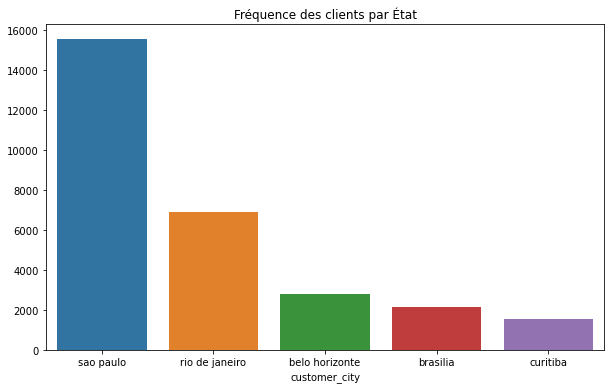

In [36]:
plt.figure(figsize=(10, 6))
top_10_cust_states = customers_df.groupby('customer_city')['customer_id'].count() \
.sort_values(ascending = False).head(5)
sns.barplot(x=top_10_cust_states.index, y=top_10_cust_states.values)
plt.title('Fréquence des clients par État')
plt.show()

On peut voir sur le graphique que la ville ayant le plus d'acheteurs est Sao Paulo.

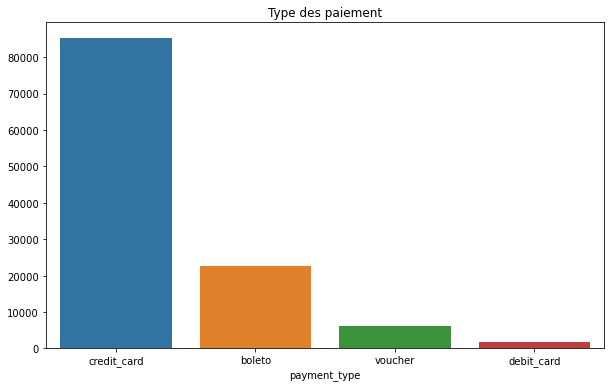

In [37]:
plt.figure(figsize=(10, 6))
top_10_cust_states = df.groupby('payment_type')['customer_id'].count() \
.sort_values(ascending = False).head(5)
sns.barplot(x=top_10_cust_states.index, y=top_10_cust_states.values)
plt.title('Type des paiement')
plt.show()

Les achats se font majoritairement par carte bancaire. 

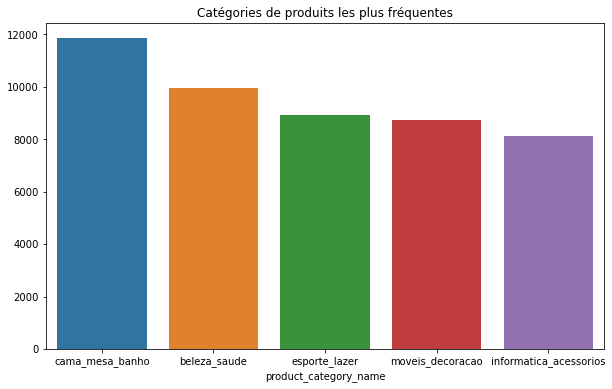

In [38]:
plt.figure(figsize=(10, 6))
top_10_cust_states = df.groupby('product_category_name')['customer_id'].count() \
.sort_values(ascending = False).head(5)
sns.barplot(x=top_10_cust_states.index, y=top_10_cust_states.values)
plt.title('Catégories de produits les plus fréquentes')
plt.show()

Voici la traduction de ces 5 catégories de produit :
    
- **cama_mesa_banho** : bain de table de lit (surement des produits d'ameublement).
- **beleza_saude** : beauté et santé.
- **esporte_lazer**: loisirs sportifs.
- **moveis_decoracao**: décoration meuble.
- **informatica_acessorios**: accessoires informatiques.

Et les catégories les plus fréquentes sont les ameublements.

Faisons maintenant une analyse RFM (Récence, Fréquence, Montant) pour la segmentation comportementale des clients.

# RFM

Que veut dire RFM ? Récence, Fréquence, Montant.

- **Récence** : la date du dernier achat. Notez bien que l’on part du principe qu’une personne qui a acheté récemment chez vous a plus de chances de revenir commander chez vous.

- **Fréquence** : le nombre d’achats réalisé sur une période donnée. Plus un client achète régulièrement chez vous, plus il y a de chances pour qu’il achète à nouveau. Vous l’avez compris, on analyse ici son niveau de fidélité.

- **Montant** : la somme des achats cumulés sur une période donnée. Les gros acheteurs répondent mieux que les petits. On mesure ici la valeur client.

RFM permet de segmenter sa base clients selon l’intention d’achat et de les cibler efficacement.

## Montant

In [39]:
df.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,payment_sequential,payment_type,...,review_answer_timestamp,product_category_name,product_name_len,product_description_len,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,1,credit_card,...,2017-10-12 03:43:48,utilidades_domesticas,40.0,268.0,4.0,500.0,19.0,8.0,13.0,housewares
1,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,3,voucher,...,2017-10-12 03:43:48,utilidades_domesticas,40.0,268.0,4.0,500.0,19.0,8.0,13.0,housewares
2,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,2,voucher,...,2017-10-12 03:43:48,utilidades_domesticas,40.0,268.0,4.0,500.0,19.0,8.0,13.0,housewares
3,128e10d95713541c87cd1a2e48201934,a20e8105f23924cd00833fd87daa0831,delivered,2017-08-15 18:29:31,2017-08-15 20:05:16,2017-08-17 15:28:33,2017-08-18 14:44:43,2017-08-28 00:00:00,1,credit_card,...,2017-08-20 15:16:36,utilidades_domesticas,40.0,268.0,4.0,500.0,19.0,8.0,13.0,housewares
4,0e7e841ddf8f8f2de2bad69267ecfbcf,26c7ac168e1433912a51b924fbd34d34,delivered,2017-08-02 18:24:47,2017-08-02 18:43:15,2017-08-04 17:35:43,2017-08-07 18:30:01,2017-08-15 00:00:00,1,credit_card,...,2017-08-08 23:26:23,utilidades_domesticas,40.0,268.0,4.0,500.0,19.0,8.0,13.0,housewares


In [40]:
# Nous supprimons les doublons
df = df.drop_duplicates(subset={
    'order_id', 'customer_id', 'order_purchase_timestamp',
    'order_delivered_customer_date'
},
                        keep='first')

df = df.reindex()

In [41]:
# Permet de voir toutes les colonnes
pd.set_option('display.max_columns', None)
df.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,payment_sequential,payment_type,payment_installments,payment_value,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,seller_zip_code_prefix,seller_city,seller_state,review_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp,product_category_name,product_name_len,product_description_len,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,1,credit_card,1,18.12,7c396fd4830fd04220f754e42b4e5bff,3149,sao paulo,SP,1,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,2017-10-06 11:07:15,29.99,8.72,9350,maua,SP,a54f0611adc9ed256b57ede6b6eb5114,4,NaN,"Não testei o produto ainda, mas ele veio corre...",2017-10-11 00:00:00,2017-10-12 03:43:48,utilidades_domesticas,40.0,268.0,4.0,500.0,19.0,8.0,13.0,housewares
3,128e10d95713541c87cd1a2e48201934,a20e8105f23924cd00833fd87daa0831,delivered,2017-08-15 18:29:31,2017-08-15 20:05:16,2017-08-17 15:28:33,2017-08-18 14:44:43,2017-08-28 00:00:00,1,credit_card,3,37.77,3a51803cc0d012c3b5dc8b7528cb05f7,3366,sao paulo,SP,1,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,2017-08-21 20:05:16,29.99,7.78,9350,maua,SP,b46f1e34512b0f4c74a72398b03ca788,4,NaN,Deveriam embalar melhor o produto. A caixa vei...,2017-08-19 00:00:00,2017-08-20 15:16:36,utilidades_domesticas,40.0,268.0,4.0,500.0,19.0,8.0,13.0,housewares
4,0e7e841ddf8f8f2de2bad69267ecfbcf,26c7ac168e1433912a51b924fbd34d34,delivered,2017-08-02 18:24:47,2017-08-02 18:43:15,2017-08-04 17:35:43,2017-08-07 18:30:01,2017-08-15 00:00:00,1,credit_card,1,37.77,ef0996a1a279c26e7ecbd737be23d235,2290,sao paulo,SP,1,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,2017-08-08 18:37:31,29.99,7.78,9350,maua,SP,dc90f19c2806f1abba9e72ad3c350073,5,NaN,"Só achei ela pequena pra seis xícaras ,mais é ...",2017-08-08 00:00:00,2017-08-08 23:26:23,utilidades_domesticas,40.0,268.0,4.0,500.0,19.0,8.0,13.0,housewares
5,bfc39df4f36c3693ff3b63fcbea9e90a,53904ddbea91e1e92b2b3f1d09a7af86,delivered,2017-10-23 23:26:46,2017-10-25 02:14:11,2017-10-27 16:48:46,2017-11-07 18:04:59,2017-11-13 00:00:00,1,boleto,1,44.09,e781fdcc107d13d865fc7698711cc572,88032,florianopolis,SC,1,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,2017-10-31 02:14:11,29.99,14.10,9350,maua,SP,1bafb430e498b939f258b9c9dbdff9b1,3,NaN,NaN,2017-11-08 00:00:00,2017-11-10 19:52:38,utilidades_domesticas,40.0,268.0,4.0,500.0,19.0,8.0,13.0,housewares
6,5f49f31e537f8f1a496454b48edbe34d,a7260a6ccba78544ccfaf43f920b7240,delivered,2017-08-24 11:31:28,2017-08-24 11:45:25,2017-08-25 14:17:55,2017-08-28 20:12:20,2017-09-14 00:00:00,1,credit_card,1,127.45,7a1de9bde89aedca8c5fbad489c5571c,1315,sao paulo,SP,2,be03d93320192443b8fa24c0ca6ead98,3504c0cb71d7fa48d967e0e4c94d59d9,2017-08-30 11:45:25,46.80,67.70,9350,maua,SP,8899ca945efd951c97107b4966289227,1,NaN,Prezados que porcaria de atendimento ao client...,2017-08-29 00:00:00,2017-08-30 02:26:02,utilidades_domesticas,59.0,189.0,3.0,775.0,16.0,16.0,13.0,housewares


Pour avoir une variable avec le montant total du paiement, nous allons créer une nouvelle variable en multipliant la variable **payment_value** qui nous donne le montant payé, avec la variable **payment_installments** qui nous donne le nombre de fois que le montant a été payé.

Par exemple si un client **achète une télévision à 300 R$** en trois fois, il y aura la valeur **3** dans la variable **payment_installments** et **100** dans la variable **payment_value**.

In [42]:
df['total_payment'] = df['payment_value'] * df['payment_installments']

Regroupons maintenant les différents clients avec leurs paiements totaux.

In [43]:
# Montant
grouped_df = df.groupby('customer_unique_id')['total_payment'].sum()
# Reset l'index pour replacer la colonne "total_payment"
grouped_df = grouped_df.reset_index()
# Renomme la colonne "total_payment" avec "monetary"
grouped_df.columns = ['customer_unique_id', 'monetary']
grouped_df.head()

,customer_unique_id,monetary
0,0000366f3b9a7992bf8c76cfdf3221e2,1135.20
1,0000b849f77a49e4a4ce2b2a4ca5be3f,27.19
2,0000f46a3911fa3c0805444483337064,689.76
3,0000f6ccb0745a6a4b88665a16c9f078,174.48
4,0004aac84e0df4da2b147fca70cf8255,1181.34


## Frequence

Regroupons maintenant les variables **customer_unique_id** et **order_id** pour obtenir la fréquence de commande des clients.

In [44]:
frequency = df.groupby('customer_unique_id')['order_id'].count()
frequency = frequency.reset_index()
frequency.columns = ['customer_unique_id', 'frequency']
frequency.head()

,customer_unique_id,frequency
0,0000366f3b9a7992bf8c76cfdf3221e2,1
1,0000b849f77a49e4a4ce2b2a4ca5be3f,1
2,0000f46a3911fa3c0805444483337064,1
3,0000f6ccb0745a6a4b88665a16c9f078,1
4,0004aac84e0df4da2b147fca70cf8255,1


In [45]:
# Fusion des deux dataframes (grouped_df et frequency)
grouped_df = pd.merge(grouped_df,
                      frequency,
                      on='customer_unique_id',
                      how='inner')
grouped_df.head()

,customer_unique_id,monetary,frequency
0,0000366f3b9a7992bf8c76cfdf3221e2,1135.20,1
1,0000b849f77a49e4a4ce2b2a4ca5be3f,27.19,1
2,0000f46a3911fa3c0805444483337064,689.76,1
3,0000f6ccb0745a6a4b88665a16c9f078,174.48,1
4,0004aac84e0df4da2b147fca70cf8255,1181.34,1


## Récence

Obtenons maintenant les dates des derniers achats des clients.

In [46]:
df['order_purchase_timestamp'] = pd.to_datetime(df['order_purchase_timestamp'],
                                                infer_datetime_format=True,
                                                errors='ignore')

# Place la date d'achat la plus récente du jeu de donnée
# dans la variable 'max_date'
max_date = max(df['order_purchase_timestamp'])

# Création d'une variable indiquant le nombre de jours du dernier achat
# en faisant la différence entre le nombre de jours du dernier achat
# avec la date la plus récente du jeu de donnée
df['diff_days'] = (max_date - df['order_purchase_timestamp']).dt.days

In [47]:
# Regroupe les clients et leurs récences dans la dataframe recency
recency = df.groupby('customer_unique_id')['diff_days'].min()
recency = recency.reset_index()
recency.columns = ['customer_unique_id', 'recency']
recency.head()

,customer_unique_id,recency
0,0000366f3b9a7992bf8c76cfdf3221e2,115
1,0000b849f77a49e4a4ce2b2a4ca5be3f,118
2,0000f46a3911fa3c0805444483337064,541
3,0000f6ccb0745a6a4b88665a16c9f078,325
4,0004aac84e0df4da2b147fca70cf8255,292


In [48]:
# Fusionne la dataframe grouped_df avec recency
rfm_df = pd.merge(grouped_df, recency, on='customer_unique_id', how='inner')
rfm_df.head()

,customer_unique_id,monetary,frequency,recency
0,0000366f3b9a7992bf8c76cfdf3221e2,1135.20,1,115
1,0000b849f77a49e4a4ce2b2a4ca5be3f,27.19,1,118
2,0000f46a3911fa3c0805444483337064,689.76,1,541
3,0000f6ccb0745a6a4b88665a16c9f078,174.48,1,325
4,0004aac84e0df4da2b147fca70cf8255,1181.34,1,292


Regardons maintenant tout cela avec des graphiques.

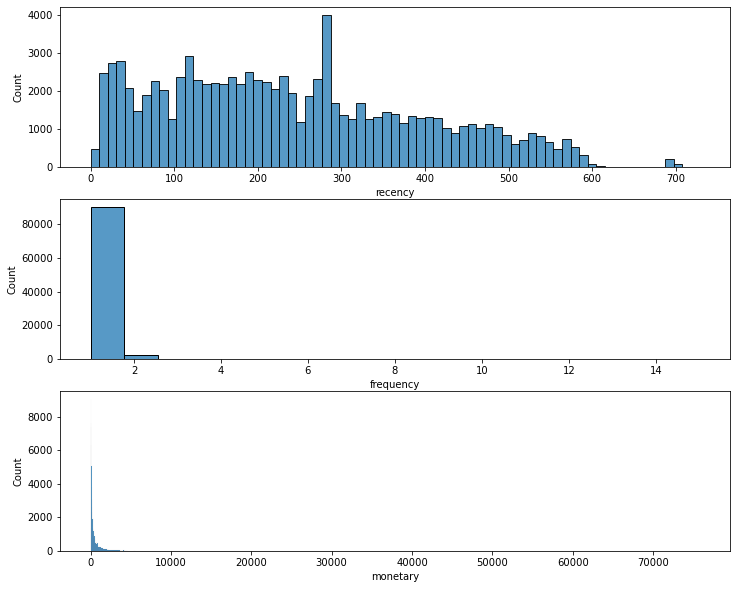

In [49]:
# Graphique de distribution RFM
plt.figure(figsize=(12, 10))
# Distribution de la récence
plt.subplot(3, 1, 1)
sns.histplot(rfm_df['recency'])
# Distribution de la fréquence
plt.subplot(3, 1, 2)
sns.histplot(rfm_df['frequency'])
# Distribution du montant
plt.subplot(3, 1, 3)
sns.histplot(rfm_df['monetary'])
plt.show()

Regardons un peu du coté des outliers.

## Valeurs Atypiques

<AxesSubplot:xlabel='recency'>

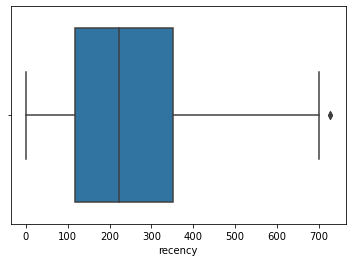

In [50]:
sns.boxplot(x=rfm_df['recency'])

<AxesSubplot:xlabel='frequency'>

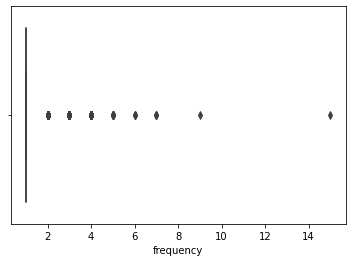

In [51]:
sns.boxplot(x=rfm_df['frequency'])

On peut voir ici que tous les points à droite de la ligne de gauche sont des outliers.

<AxesSubplot:xlabel='monetary'>

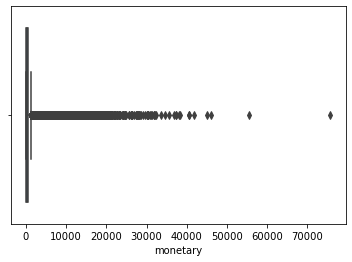

In [52]:
sns.boxplot(x=rfm_df['monetary'])

On peut voir ici également que tous les points à droite de la ligne de gauche sont des outliers.

In [53]:
# Retrouve l'id du client avec le montant le plus élevé
rfm_df.iloc[rfm_df['monetary'].idxmax()]

customer_unique_id    da122df9eeddfedc1dc1f5349a1a690c
monetary                                       75716.3
frequency                                            2
recency                                            519
Name: 79679, dtype: object

In [54]:
# Retrouve le client avec le montant le plus élevé dans notre dataframe
# pour nous permettre de savoir si le client est réel ou non
df.loc[df['customer_unique_id'] == 'da122df9eeddfedc1dc1f5349a1a690c']

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,payment_sequential,payment_type,payment_installments,payment_value,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,seller_zip_code_prefix,seller_city,seller_state,review_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp,product_category_name,product_name_len,product_description_len,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english,total_payment,diff_days
107636,8ea7aebc18842332aad5f41ca74b334c,349509b216bd5ec11c5fae929fd13595,delivered,2017-04-01 15:58:41,2017-04-03 13:25:19,2017-04-11 14:42:25,2017-04-17 14:36:23,2017-05-09 00:00:00,1,credit_card,10,2621.29,da122df9eeddfedc1dc1f5349a1a690c,28970,araruama,RJ,1,3ecf69ee1fe21cfd40b30cbea549e563,59417c56835dd8e2e72f91f809cd4092,2017-04-19 13:25:19,2589.0,32.29,13480,limeira,SP,51d8c7fe1241e5d4cab50cedf8264985,5,NaN,NaN,2017-04-18 00:00:00,2017-04-19 01:28:52,eletroportateis,41.0,3564.0,1.0,6300.0,35.0,35.0,30.0,small_appliances,26212.9,519
107646,a96610ab360d42a2e5335a3998b4718a,df55c14d1476a9a3467f131269c2477f,delivered,2017-04-01 15:58:40,2017-04-03 13:25:18,2017-04-11 15:10:34,2017-04-17 11:04:45,2017-05-02 00:00:00,1,credit_card,10,4950.34,da122df9eeddfedc1dc1f5349a1a690c,28970,araruama,RJ,1,a6492cc69376c469ab6f61d8f44de961,59417c56835dd8e2e72f91f809cd4092,2017-04-18 13:25:18,4799.0,151.34,13480,limeira,SP,52632252782892317727260a87bc0663,5,NaN,NaN,2017-04-18 00:00:00,2017-04-21 15:17:33,eletroportateis,41.0,1780.0,2.0,22600.0,55.0,40.0,40.0,small_appliances,49503.4,519


Ces valeurs ne seront pas supprimées, ce sont des valeurs réelles, et atypiques.

Nous pensons que les supprimer serait une grave erreur étant donné que ces clients sont les plus gros.

Notre analyse exploratoire étant terminé, nous allons exporter nos dataframes sous csv pour pouvoir les utiliser dans notre notebook d'essais.

In [55]:
# Les deux dataframe seront utilisées dans le notebook d'essai pour la partie
# modeling La dataframe 'rfm_df' pour utiliser le RFM lors de notre clustering
# La dataframe 'df' pour utiliser différentes variables puis comparer ces
# modèles avec les modèles entrainés avec les données RFM
rfm_df.to_csv(r'data/RFM.csv')
df.to_csv(r'data/df.csv')